## Feature Variable Analysis

### Introduction to Feature Variable Analysis of Wind Farm and Solar Station Sites

This comprehensive analysis explores data from multiple wind farm sites and solar station sites. The objective is to evaluate the wind and solar energy potential and optimize the performance of these renewable energy sources. Data from each site has been carefully processed and standardized for an accurate and detailed comparative analysis.

#### Data Acquisition
The datasets for each site (both wind farms and solar stations) have been sourced from processed Excel files. Initial rows, which may contain metadata or formatting inconsistencies, are removed to ensure a clean dataset for analysis.

#### Variables of Interest
The datasets include key features essential for analyzing the performance of both wind farms and solar stations:
- **Wind Farms**: Wind speed and direction at multiple heights, air temperature, atmospheric pressure, relative humidity, and power output in MW.
- **Solar Stations**: Total Solar Irradiance (TSI), Direct Normal Irradiance (DNI), Global Horizontal Irradiance (GHI), alongside air temperature, pressure, humidity, and power output in MW.

#### Data Processing Steps
Columns are renamed across datasets for consistency, allowing for straightforward comparative and aggregate analysis. This uniformity is crucial for maintaining clarity and precision in handling the data across different energy generation sites.

#### Exploratory Data Analysis (EDA)
For both wind farms and solar stations, pair plots are utilized to observe pairwise relationships between variables. This helps in understanding how different variables interact with each other and their combined effect on power generation. Histograms and density plots reveal the distribution of individual variables, indicating trends and potential outliers.

#### Correlation Analysis
Correlation matrices are generated to identify the relationships between meteorological conditions and power output. This analysis is vital in understanding which environmental factors most significantly impact energy production:
- **Wind Farms**: Correlations between different heights of wind speed measurements and power output are particularly emphasized.
- **Solar Stations**: The focus is on the correlation between different measures of solar irradiance (TSI, DNI, GHI) and the power output, as well as how meteorological conditions like temperature and humidity impact solar energy generation.

#### Initial Observations and Insights
- **Wind Farms**: Strong correlations are observed among different wind speeds at various measurement heights, suggesting uniform wind patterns. The correlation between wind speed and power output is significant, indicating that higher wind speeds lead to increased energy production.
- **Solar Stations**: There is a high correlation between measures of solar irradiance and power output, which is expected as solar power generation directly depends on the amount of solar radiation received. The relationship between air temperature and power output shows variability, which may be influenced by local climatic conditions and technology-specific factors.


### Data Analysis for Wind Farm Sites

In [264]:
# upload the data from .xslx files
import pandas as pd
Dataset_WF_site1 = pd.read_excel(r'../renewable_energy_data/data_processed/WF_site1_processed.xlsx'
                                ).drop(index=0)
Dataset_WF_site2 = pd.read_excel(r'../renewable_energy_data/data_processed/WF_site2_processed.xlsx'
                                ).drop(index=0)
Dataset_WF_site3 = pd.read_excel(r'../renewable_energy_data/data_processed/WF_site3_processed.xlsx'
                                ).drop(index=0)
Dataset_WF_site4 = pd.read_excel(r'../renewable_energy_data/data_processed/WF_site4_processed.xlsx'
                                ).drop(index=0)
Dataset_WF_site5 = pd.read_excel(r'../renewable_energy_data/data_processed/WF_site5_processed.xlsx'
                                ).drop(index=0)
Dataset_WF_site6 = pd.read_excel(r'../renewable_energy_data/data_processed/WF_site6_processed.xlsx'
                                ).drop(index=0)

In [265]:
Dataset_WF_site1.head()

,Time(year-month-day h:m:s),Wind speed at height of 10 meters (m/s),Wind direction at height of 10 meters (˚),Wind speed at height of 30 meters (m/s),Wind direction at height of 30 meters (˚),Wind speed at height of 50 meters (m/s),Wind direction at height of 50 meters (˚),Wind speed - at the height of wheel hub(m/s),Wind speed - at the height of wheel hub (˚),Air temperature (°C),Atmosphere (hpa),Relative humidity (%),Power (MW)
1,2019-01-01 00:30:00,2.193,109.903,2.313,84.688,2.344,89.100,2.350,78.550,-13.766,889.942,76.981,0.296306
2,2019-01-01 00:45:00,2.654,109.903,2.494,74.939,2.574,87.267,2.808,82.733,-13.691,889.675,76.821,0.187590
3,2019-01-01 01:00:00,2.249,109.903,2.192,91.140,2.558,96.900,2.924,92.967,-13.447,890.025,74.571,0.081005
4,2019-01-01 01:15:00,1.974,109.903,1.980,91.921,2.049,97.000,2.137,100.133,-13.983,889.692,71.808,0.189721
5,2019-01-01 01:30:00,2.220,109.903,2.336,98.886,2.408,110.533,2.506,103.000,-14.014,889.967,70.816,0.265041


In [266]:
# Standardize Column Name
for dataset in [Dataset_WF_site1, Dataset_WF_site2,Dataset_WF_site3, Dataset_WF_site4, Dataset_WF_site5, Dataset_WF_site6]:
    dataset.columns=['time','WS_10','WD_10','WS_30','WD_30','WS_50','WD_50','WS_cen','WD_cen','Air_T','Air_P','Air_H','Power(MW)']
    

In [267]:
Dataset_WF_site3.head()

,time,WS_10,WD_10,WS_30,WD_30,WS_50,WD_50,WS_cen,WD_cen,Air_T,Air_P,Air_H,Power(MW)
1,2019-01-01 00:30:00,2.32218,317.431,2.59042,312.468,1.62735,351.117,2.34887,313.33,26.46,984.37,31.7949,-0.387959
2,2019-01-01 00:45:00,2.32218,317.431,2.59042,312.468,1.62735,351.117,2.34887,313.33,26.46,984.37,31.7949,-0.395348
3,2019-01-01 01:00:00,2.32218,317.431,2.59042,312.468,1.62735,351.117,2.34887,313.33,26.46,984.37,31.7949,-0.384264
4,2019-01-01 01:15:00,2.32218,317.431,2.59042,312.468,1.62735,351.117,2.34887,313.33,26.46,984.37,31.7949,-0.406433
5,2019-01-01 01:30:00,2.32218,317.431,2.59042,312.468,1.62735,351.117,2.34887,313.33,26.46,984.37,31.7949,-0.384264


In [268]:
# missing data and outliers processing
from collections import Counter
# Counter(Dataset_WF_site1['WS_10']).most_common()
Dataset_WF_site3['Air_T'].value_counts()

Air_T
 26.460    11193
 0.000       429
 25.250       58
 14.810       58
 25.530       56
           ...  
 1.260         1
 1.416         1
 0.947         1
 0.966         1
-5.178         1
Name: count, Length: 10932, dtype: int64

/Users/yangyilin/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/Users/yangyilin/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


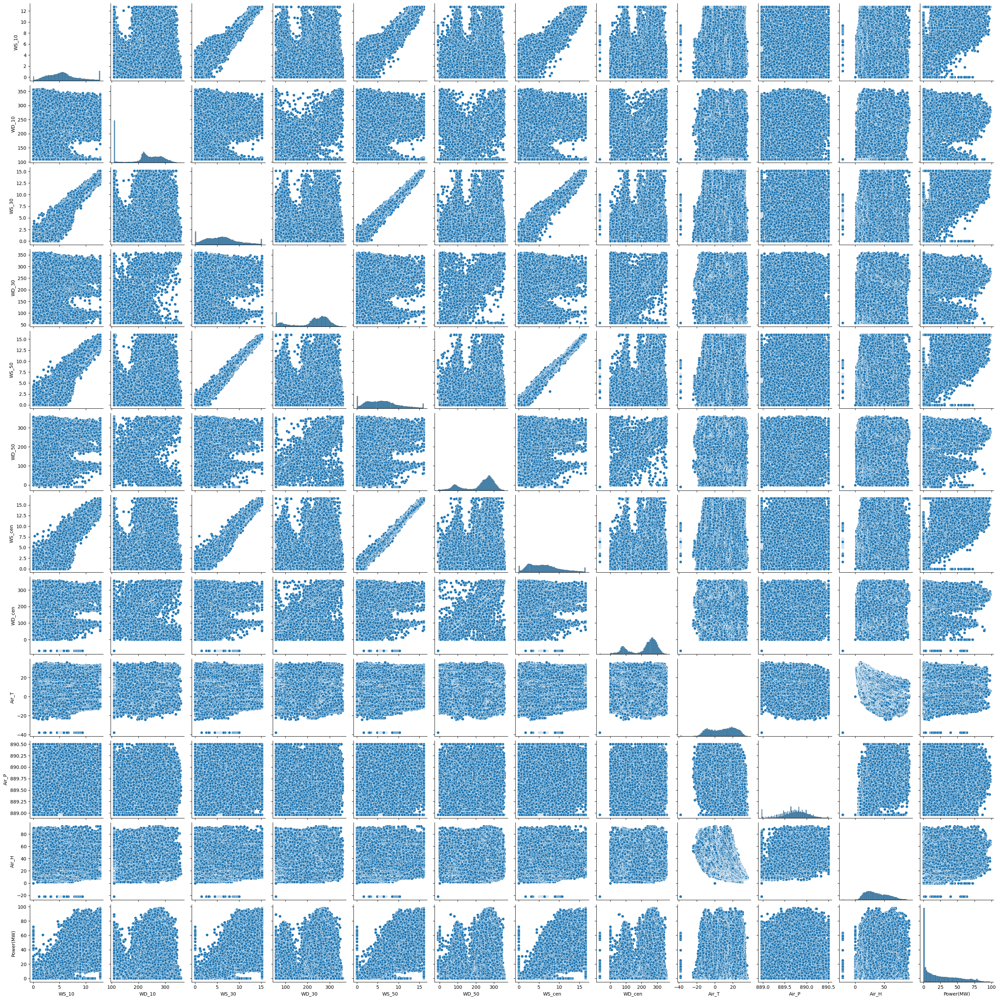

In [269]:
import seaborn as sns
sns.pairplot(Dataset_WF_site1, hue=None, size=2.5)

Here is the pairplot generated by Seaborn for the dataset from Wind Farm Site 1. A pairplot displays pairwise relationships in a dataset. It consists of a matrix of axes where each variable in the dataset is shared across the y-axes of one row and the x-axes of one column. The main diagonal often shows the distribution of the variable in the form of a histogram or a kernel density estimate.

1. **Histograms**: On the diagonal, the histograms show the distribution of individual variables. Sharp peaks might indicate a strong central tendency, while flat distributions suggest uniformity across a range of values. Look for any skewness or multimodality (multiple peaks), which can hint at subpopulations or the need for data transformation.

2. **Scatter Plots**: Off-diagonal plots are scatter plots representing the relationship between pairs of variables. Linear relationships appear as trends or clusters of points along a line, which may indicate correlation between variables. Conversely, a more cloud-like spread suggests little to no linear relationship.

3. **Density Plots**: Sometimes, instead of scatter plots, pairplots include density plots to show where points are most concentrated.

4. **Correlations**: Positive correlations are indicated by points clustered along a line that runs from the bottom left to the top right of these off-diagonal plots. Negative correlations would run from the top left to the bottom right.

5. **Outliers**: Look for isolated points that don't follow the overall pattern. These may be outliers that could potentially skew the results of any analysis or modeling.

6. **Variable Relationships**: 
   - Linear relationships might suggest a direct proportionality or an inverse relationship between variables.
   - Clusters might indicate groups or classes within the data that could be significant.
   - Any cyclical patterns might suggest a periodic relationship that could be due to seasonal or time-of-day effects.

7. **Scale and Units**: Consider the scale and units of the variables. Variables measured in different units or scales may need to be standardized or normalized if they're used together in subsequent analysis.

8. **Nonlinear Patterns**: Nonlinear patterns or heteroscedasticity (variance changing with the level of another variable) could indicate more complex dependencies that linear models might not capture.

In [270]:
import numpy as np
# Identify numeric columns
numeric_cols = Dataset_WF_site1.select_dtypes(include=[np.number])

# Calculate correlation only on numeric columns
corr_matrix = numeric_cols.corr().round(2)

# Display the correlation matrix
print(corr_matrix)

           WS_10  WD_10  WS_30  WD_30  WS_50  WD_50  WS_cen  WD_cen  Air_T  \
WS_10       1.00   0.40   0.97   0.43   0.94   0.46    0.93    0.47   0.25   
WD_10       0.40   1.00   0.38   0.92   0.39   0.87    0.39    0.84   0.25   
WS_30       0.97   0.38   1.00   0.42   0.99   0.46    0.98    0.48   0.28   
WD_30       0.43   0.92   0.42   1.00   0.41   0.94    0.41    0.90   0.25   
WS_50       0.94   0.39   0.99   0.41   1.00   0.45    0.99    0.47   0.29   
WD_50       0.46   0.87   0.46   0.94   0.45   1.00    0.44    0.95   0.26   
WS_cen      0.93   0.39   0.98   0.41   0.99   0.44    1.00    0.46   0.30   
WD_cen      0.47   0.84   0.48   0.90   0.47   0.95    0.46    1.00   0.29   
Air_T       0.25   0.25   0.28   0.25   0.29   0.26    0.30    0.29   1.00   
Air_P       0.04   0.07   0.05   0.07   0.05   0.08    0.05    0.08  -0.26   
Air_H      -0.02   0.05  -0.01   0.05  -0.01   0.05   -0.02    0.03  -0.61   
Power(MW)   0.81   0.34   0.85   0.36   0.86   0.38    0.87    0

Here's an explanation of some key correlations observed:

1. **Wind Speed (WS) Variables:**

WS_10, WS_30, WS_50, and WS_cen are highly positively correlated with each other (correlation coefficients ranging from 0.93 to 0.99). This indicates that the wind speed readings at different heights and the central reading move very similarly, which is expected since they measure the same phenomenon at slightly different positions.

2. **Wind Direction (WD) Variables:**

WD_10, WD_30, WD_50, and WD_cen are also highly positively correlated with each other (coefficients from 0.84 to 0.95), suggesting that the wind direction is relatively consistent across the different measuring heights.

3. **Wind Speed and Power Output:**

WS_10, WS_30, WS_50, and WS_cen show strong positive correlations with Power(MW) (coefficients 0.81, 0.85, 0.86, and 0.87 respectively). This implies that higher wind speeds are associated with greater power output, which is a logical outcome for wind farms.

4. **Wind Direction and Power Output:**

WD_10, WD_30, WD_50, and WD_cen have weaker positive correlations with Power(MW) (coefficients 0.34, 0.36, 0.38, and 0.39). While there is some relationship, it’s not as strong as with wind speed, indicating that wind direction has a lesser but still notable effect on power production.

5. **Air Temperature (Air_T):**

Air_T shows a moderate negative correlation with Air_H (humidity) (-0.61), meaning that as temperature increases, humidity tends to decrease.
Air_T has a weak positive correlation with Power(MW) (0.22), suggesting a slight increase in power output with rising temperatures.

6. **Air Pressure (Air_P):**

Air_P shows a moderate positive correlation with Air_H (0.47), implying that higher air pressure is associated with higher humidity levels.
Air_P has a very weak correlation with Power(MW) (0.07), suggesting air pressure has a negligible direct effect on power output.

7. **Air Humidity (Air_H):**

Air_H has almost no correlation with Power(MW) (0.03), indicating that humidity levels have little to no linear relationship with power output.

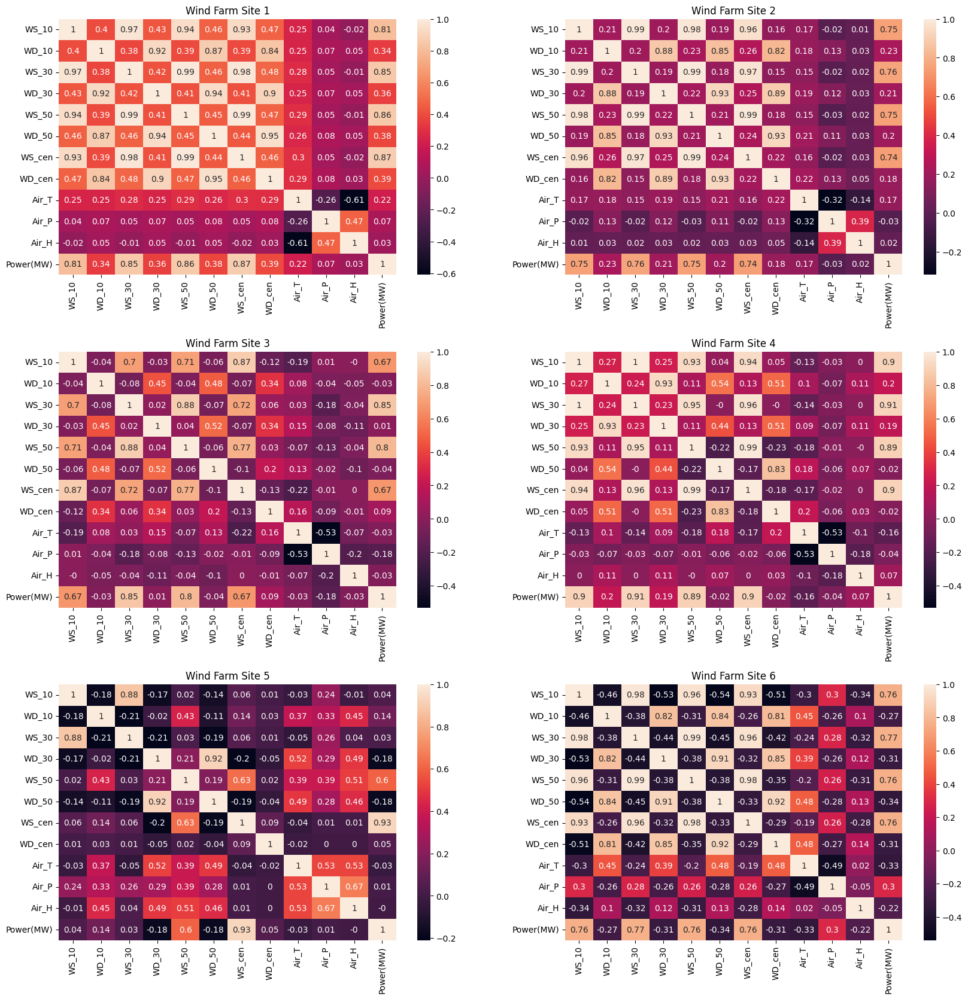

In [273]:
from matplotlib import pyplot as plt
import seaborn as sns
import math

# Prepare the subplot structure
fig, axes = plt.subplots(3, 2, figsize=(20, 20))
plt.subplots_adjust(hspace=0.3)

# Loop over the datasets and respective subplot axes
for data, i in zip([Dataset_WF_site1, Dataset_WF_site2, Dataset_WF_site3, Dataset_WF_site4, Dataset_WF_site5, Dataset_WF_site6], range(6)):
    # Filter out non-numeric data to avoid errors in correlation calculation
    numeric_data = data.select_dtypes(include=[np.number])
    
    # Calculate the correlation matrix and round it for better display
    corr_matrix = numeric_data.corr().round(2)
    
    # Plot the heatmap
    sns.heatmap(corr_matrix, annot=True, ax=axes[math.floor(i/2)][i%2]).set(title=f'Wind Farm Site {i+1}')


plt.savefig('../image/wf_heatmap.pdf', bbox_inches='tight')
# Display the plot
plt.show()


1. **Strong Correlation Among Wind Speed Measurements**:
   - The wind speed variables (WS_10, WS_30, WS_50, WS_cen) are consistently showing high positive correlations across all wind farm sites. This suggests that regardless of the measurement height, the wind speed tends to be uniform, indicating cohesive wind patterns across the measured altitudes.

2. **Moderate to Strong Correlation Between Wind Speed and Power Output**:
   - There is a moderate to strong positive correlation between wind speeds at various heights and power output. This is expected as higher wind speeds usually translate to more kinetic energy available for conversion to electrical power.

3. **Wind Direction Less Correlated with Power Output**:
   - Wind direction (WD_10, WD_30, WD_50, WD_cen) shows a weaker positive correlation with power output compared to wind speed. This indicates that while wind direction does influence power generation, it is not as significant a factor as wind speed.

4. **Temperature and Humidity Correlation Variability**:
   - Temperature (Air_T) and humidity (Air_H) show varied correlations with power output across different sites, which could be due to local climatic conditions that influence how these factors affect wind turbine efficiency.

5. **Air Pressure's Low Impact**:
   - Air pressure (Air_P) tends to have a low correlation with power output, suggesting that it does not have a major direct impact on the amount of power generated by the wind farms.

6. **Correlation Between Wind Direction Variables**:
   - The wind direction measurements at different heights also display a good positive correlation with each other, suggesting consistent wind flow direction across the different layers of measurement.

7. **Variable Correlation Strength Across Sites**:
   - The strength of the correlations, especially between meteorological conditions and power output, varies among the sites. This implies that site-specific factors, possibly including turbine technology, geography, and local weather patterns, may affect the efficiency of power generation.

### Data Analysis of Solar Stations

In [274]:
Dataset_SS_site1 = pd.read_excel(r'../renewable_energy_data/data_processed/SS_site1_processed.xlsx'
                                ).drop(index=0)
Dataset_SS_site2 = pd.read_excel(r'../renewable_energy_data/data_processed/SS_site2_processed.xlsx'
                                ).drop(index=0)
Dataset_SS_site3 = pd.read_excel(r'../renewable_energy_data/data_processed/SS_site3_processed.xlsx'
                                ).drop(index=0)
Dataset_SS_site4 = pd.read_excel(r'../renewable_energy_data/data_processed/SS_site4_processed.xlsx'
                                ).drop(index=0)
Dataset_SS_site5 = pd.read_excel(r'../renewable_energy_data/data_processed/SS_site5_processed.xlsx'
                                ).drop(index=0)
Dataset_SS_site6 = pd.read_excel(r'../renewable_energy_data/data_processed/SS_site6_processed.xlsx'
                                ).drop(index=0)
Dataset_SS_site7 = pd.read_excel(r'../renewable_energy_data/data_processed/SS_site7_processed.xlsx'
                                ).drop(index=0)
Dataset_SS_site8 = pd.read_excel(r'../renewable_energy_data/data_processed/SS_site8_processed.xlsx'
                                ).drop(index=0)

In [275]:
for dataset in [Dataset_SS_site1, Dataset_SS_site2, Dataset_SS_site3, Dataset_SS_site4
                , Dataset_SS_site5, Dataset_SS_site6, Dataset_SS_site7, Dataset_SS_site8]:
    dataset.columns=['time','TSI','DNI','GHI','Air_T','Air_P','Air_H','Power(MW)']

In [276]:
Dataset_SS_site6.head()

,time,TSI,DNI,GHI,Air_T,Air_P,Air_H,Power(MW)
1,2019-01-01 00:30:00,0.0,0.0,0.0,11.360000,837.21330,57.160000,0.0
2,2019-01-01 00:45:00,0.0,0.0,0.0,11.313334,837.20000,58.733334,0.0
3,2019-01-01 01:00:00,0.0,0.0,0.0,11.260000,837.09330,59.933334,0.0
4,2019-01-01 01:15:00,0.0,0.0,0.0,10.933333,836.94666,62.113335,0.0
5,2019-01-01 01:30:00,0.0,0.0,0.0,10.900000,836.81335,62.213333,0.0


In [277]:
# outliers processing
Dataset_SS_site7.isnull().sum()

time         0
TSI          0
DNI          0
GHI          0
Air_T        0
Air_P        0
Air_H        0
Power(MW)    0
dtype: int64

In [278]:
for dataset in [Dataset_SS_site1, Dataset_SS_site2, Dataset_SS_site3, Dataset_SS_site4
                , Dataset_SS_site5, Dataset_SS_site6, Dataset_SS_site7, Dataset_SS_site8]:
    for tile in ['TSI','DNI','GHI','Air_T','Air_P','Air_H','Power(MW)']:
        dataset[tile]= dataset[tile].astype('float')

In [279]:
Dataset_SS_site5.dropna(how='any', inplace=True)
Dataset_SS_site5.loc[10310:10315,:]

,time,TSI,DNI,GHI,Air_T,Air_P,Air_H,Power(MW)
10310,2019-04-18 09:45:00,761.0,650.0,629.0,28.0,1002.1,46.5,49.32
10311,2019-04-18 10:00:00,797.0,674.0,662.0,28.5,1002.4,43.6,49.32
10312,2019-04-18 10:15:00,763.0,658.0,627.0,29.5,1002.4,41.5,49.32
10313,2019-04-18 10:30:00,778.0,682.0,649.0,29.2,1002.4,40.9,49.32
10314,2019-04-18 10:45:00,913.0,746.0,757.0,29.5,1002.3,37.8,49.32
10315,2019-04-18 11:00:00,348.0,358.0,237.0,28.1,1002.3,39.9,40.39


In [280]:
Dataset_SS_site6.loc[5320:5330,:]

,time,TSI,DNI,GHI,Air_T,Air_P,Air_H,Power(MW)
5320,2019-02-25 10:15:00,659.533300,828.400000,77.733330,18.240000,832.013300,25.013334,17.448668
5321,2019-02-25 10:30:00,724.666700,860.600000,88.200000,18.486666,832.000000,23.886667,19.428667
5322,2019-02-25 10:45:00,760.466700,851.933350,92.933334,18.926666,831.746640,22.846666,20.671333
5323,2019-02-25 11:00:00,821.888913,855.511133,99.155556,19.237777,831.651093,22.313333,20.671333
5324,2019-02-25 11:15:00,883.311127,859.088917,105.377778,19.548889,831.555547,21.779999,20.671333
5325,2019-02-25 11:30:00,944.733340,862.666700,111.600000,19.860000,831.460000,21.246666,24.822666
5326,2019-02-25 11:45:00,965.266660,851.800000,114.933334,20.446667,831.566650,20.933332,25.630000
5327,2019-02-25 12:00:00,996.333300,853.866640,119.200000,20.853333,831.320000,20.680000,26.531334
5328,2019-02-25 12:15:00,1042.000000,861.866640,123.533330,21.046667,831.213300,20.486666,27.445333
5329,2019-02-25 12:30:00,1084.866700,861.266660,126.466670,21.373333,830.700000,19.960000,28.079334


In [281]:
Dataset_SS_site5.dtypes

time         datetime64[ns]
TSI                 float64
DNI                 float64
GHI                 float64
Air_T               float64
Air_P               float64
Air_H               float64
Power(MW)           float64
dtype: object

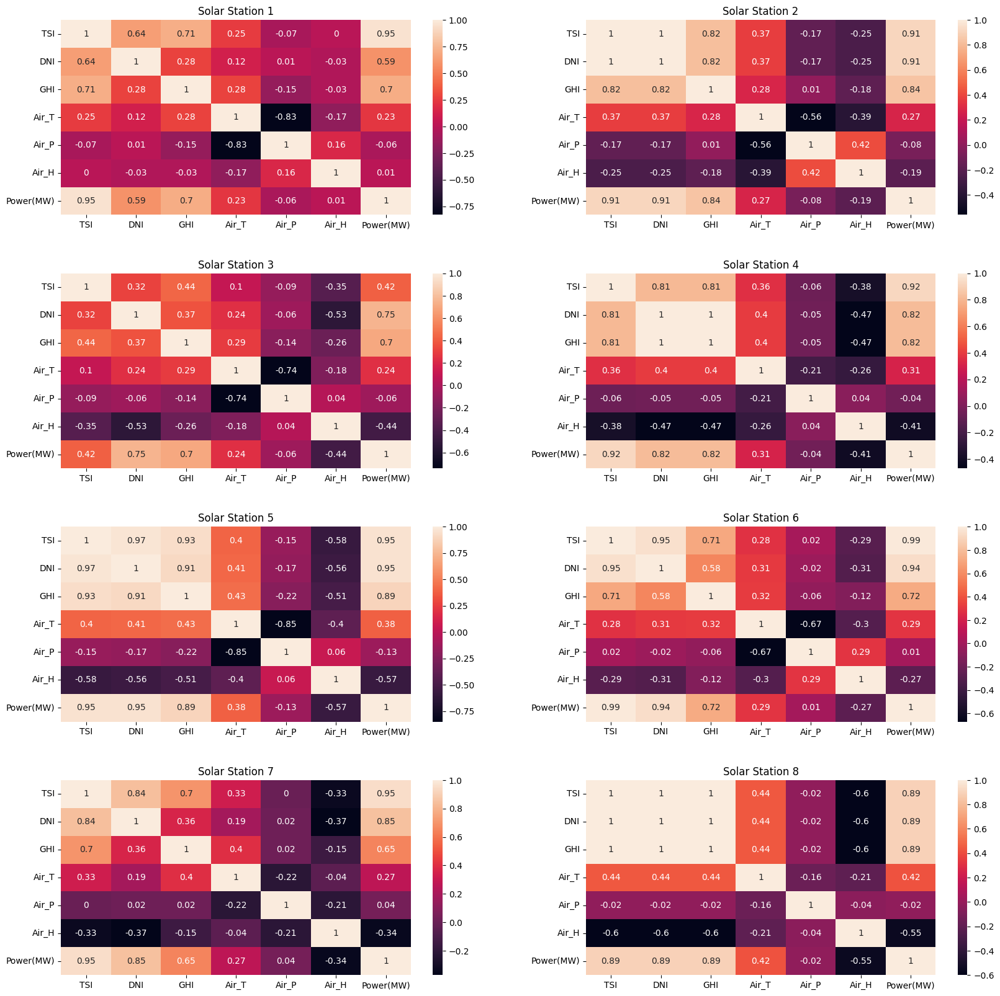

In [283]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

fig, axes = plt.subplots(4, 2, figsize=(20, 20))
plt.subplots_adjust(hspace=0.3)

for data, i in zip([Dataset_SS_site1, Dataset_SS_site2, Dataset_SS_site3, Dataset_SS_site4,
                    Dataset_SS_site5, Dataset_SS_site6, Dataset_SS_site7, Dataset_SS_site8],
                   range(8)):
    # Select only numeric data for correlation calculation
    numeric_data = data.select_dtypes(include=[np.number])
    correlation_matrix = numeric_data.corr().round(2)

    # Create heatmap
    sns.heatmap(correlation_matrix, annot=True, ax=axes[math.floor(i/2)][i%2])
    axes[math.floor(i/2)][i%2].set_title(f'Solar Station {i+1}')
plt.savefig('../image/ss_heatmap.pdf', bbox_inches='tight')
plt.show()

The heatmaps provided depict the correlation matrices for eight different solar station datasets. Observing these heatmaps allows us to identify several patterns and insights about the relationships between various meteorological conditions and power output (measured in MW) for solar power generation. Here are some observations from the heatmaps:

1. **High Correlation Between Solar Irradiance Measures**:
   - There's a high positive correlation between Total Solar Irradiance (TSI), Direct Normal Irradiance (DNI), and Global Horizontal Irradiance (GHI) across all solar stations. This indicates that these irradiance measures tend to increase and decrease together, which is expected because they are all measures of the sun’s energy reaching the earth's surface.

2. **Power Output Correlation with Irradiance**:
   - The power output from the solar panels (Power(MW)) has a very strong positive correlation with TSI, DNI, and GHI across most stations. This suggests that as the solar irradiance increases, the power output from solar panels also increases, which aligns with the understanding that solar power generation depends directly on the amount of solar radiation received.

3. **Temperature Relationship with Irradiance and Power**:
   - Air temperature (Air_T) shows a variable relationship with irradiance measures and power output. At some stations, there is a positive correlation, while at others, it's negligible or negative. This variability may be due to other confounding factors such as cooling efficiency and the temperature coefficient of the solar panels.

4. **Temperature and Humidity**:
   - There is generally a negative correlation between air temperature and air humidity (Air_H), which might indicate that higher temperatures often correspond to lower humidity levels and vice versa.

5. **Pressure Correlations**:
   - Air pressure (Air_P) seems to have a low to negligible correlation with power output across most stations, indicating that air pressure has little direct influence on the amount of power generated by solar panels.

6. **Consistency Across Stations**:
   - Although the strength of the correlations varies somewhat from one solar station to another, the overall patterns remain consistent. This could be due to similar geographical conditions or comparable equipment and measurement methods.

## plot the missing data situation of wind farm and solar station

In [262]:
Dataset_WF_site2['WS_cen'].value_counts()

WS_cen
0.000    3300
8.765     502
9.530     472
9.224     462
8.612     452
         ... 
3.080       1
5.940       1
3.790       1
1.364       1
3.608       1
Name: count, Length: 3478, dtype: int64

Text(0, 0.5, 'Wind speed at hub height (m/s)')

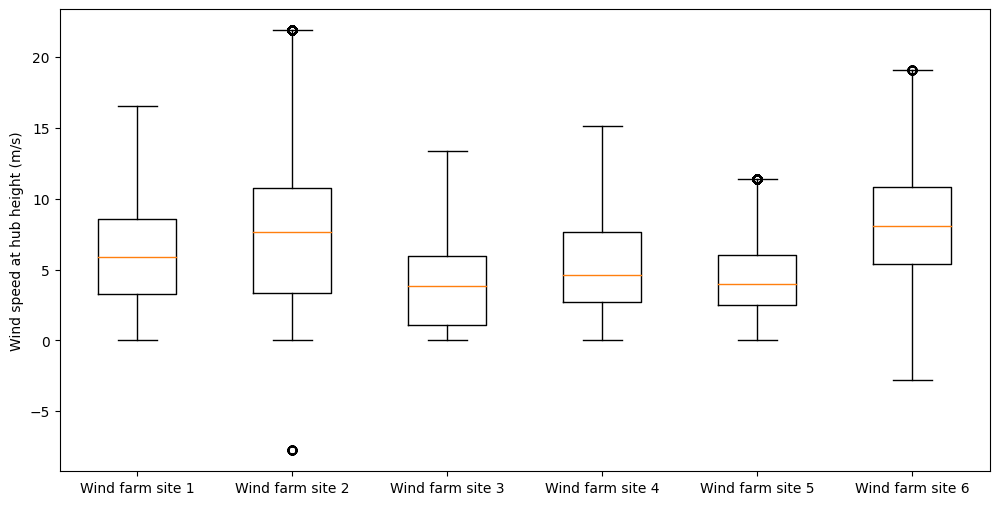

In [263]:
# drop value missing data
WS_name = ['Wind farm site 1', 'Wind farm site 2', 'Wind farm site 3', 'Wind farm site 4', 'Wind farm site 5', 'Wind farm site 6']
plt.figure(figsize=(12,6))
plt.boxplot([Dataset_WF_site1.drop(Dataset_WF_site1[Dataset_WF_site1['WS_cen'] == -99].index).WS_cen
             ,Dataset_WF_site2.drop(Dataset_WF_site2[Dataset_WF_site2['WS_cen'] == -99].index).WS_cen
             ,Dataset_WF_site3.WS_cen
             ,Dataset_WF_site4.WS_cen.dropna()
             ,Dataset_WF_site5.WS_cen.dropna()
             ,Dataset_WF_site6.drop(Dataset_WF_site6[Dataset_WF_site6['WS_cen'] == -99].index).WS_cen]
             ,labels=WS_name);
plt.ylabel('Wind speed at hub height (m/s)')

The boxplot visualizes the distribution of central wind speed (at hub height) across six wind farm sites. Here's an observation based on the provided description and the image:

1. **Central Tendency and Spread**:
   - Wind farm sites generally show a median wind speed around the middle of the box, which represents the median value of the wind speed distribution. The spread, or interquartile range (IQR), is represented by the box itself.

2. **Outliers**:
   - There are outlier points indicated by circles beyond the "whiskers" of the boxplot for some of the wind farms. These points fall outside the typical range of data (1.5 times the IQR from the lower and upper quartiles).

3. **Consistency Across Sites**:
   - All wind farm sites show variability in wind speed, as indicated by the range of values within each boxplot. However, the variability differs between sites, with some sites showing a wider range, which could be indicative of more variable wind conditions.

4. **Missing and Dropped Data**:
   - The statement mentions dropping data where the wind speed at the center (WS_cen) is recorded as -99, which is likely considered a placeholder for missing or erroneous data.

5. **Data Integrity Issues**:
   - Wind Farm Site 2 has a significant number of zero wind speed readings (3300 counts), which might indicate sensor issues or data collection problems. These zero readings could significantly affect the average wind speed calculation and any related analyses.

6. **Sample Size Discrepancy**:
   - With missing data samples mentioned for Wind Farm Sites 1 and 2, there may be discrepancies in the number of data points across different sites, which could affect comparative analyses.

7. **Data Quality**:
   - No outliers were reported for Sites 1 and 2, which may indicate that after removing the erroneous -99 values, the remaining data points did not contain any extreme variations.

In summary, the boxplot provides a snapshot of the wind conditions at different wind farm sites, showcasing the central tendencies and variabilities in wind speeds. The presence of outliers indicates that some extreme wind speed events occurred, which could be important for stress testing the wind turbine design. The handling of missing data and the identification of outliers are crucial to ensure the accuracy of wind speed analysis and the optimal functioning of the wind farms.

/var/folders/yw/_jb44sv96y7_3954sb_smmcc0000gn/T/ipykernel_12854/686216836.py:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(Dataset_WF_site1.drop(Dataset_WF_site1[Dataset_WF_site1['WS_cen'] == -99].index).WS_cen)
/var/folders/yw/_jb44sv96y7_3954sb_smmcc0000gn/T/ipykernel_12854/686216836.py:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de

<Axes: xlabel='WS_cen', ylabel='Density'>

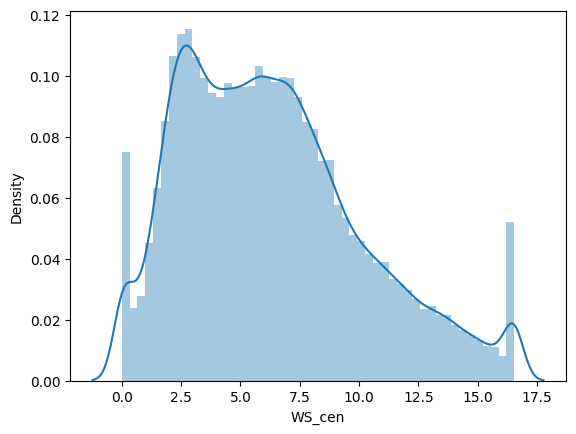

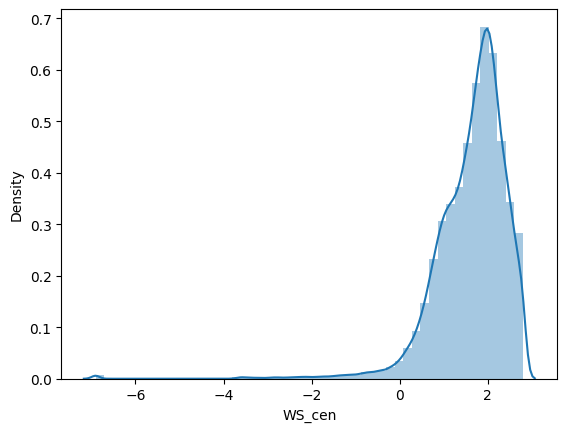

In [199]:
# skewness analysis of wind farms
sns.distplot(Dataset_WF_site1.drop(Dataset_WF_site1[Dataset_WF_site1['WS_cen'] == -99].index).WS_cen)
log_data = np.log(Dataset_WF_site1.drop(Dataset_WF_site1[(Dataset_WF_site1['WS_cen'] == -99)|(Dataset_WF_site1['WS_cen'] == 0.0)].index).WS_cen)
fig = plt.figure()
sns.distplot(log_data)

Based on the description and the images provided, here are observations related to the skewness analysis of wind speeds (WS_cen) for a wind farm:

1. **First Density Plot (Original Data)**:
   - The distribution has a peak at a lower wind speed value, and the tail extends towards the higher wind speed values, which suggests a right-skewed distribution.
   - There are visible gaps or bins with a low density between the main distribution and the tail, indicating potential outlier wind speeds or intermittent wind speed occurrences.

2. **Second Density Plot (Log-transformed Data)**:
   - After log transformation, the distribution of wind speeds still appears skewed, but this time it's left-skewed, as indicated by the tail extending towards the left (negative values after log transformation, which is technically not possible since log of zero or negative values is undefined).
   - The peak is sharp and close to zero, which suggests that most of the wind speeds are clustering around a low value after log transformation.
   - There is a noticeable separation between the bulk of the data and some data points, suggesting that even after transformation, there may be distinct groupings within the data.

**Observations and Implications**:
- The right skew in the original data implies that while most wind speed readings are lower, there are periods of significantly higher wind speeds.
- The skewness and gaps may indicate variable wind conditions, possibly influenced by local geography, weather events, or data recording anomalies.
- The log transformation usually helps normalize right-skewed data. However, in this case, the resulting left skew indicates that the transformation may not be suitable, or the data contains values that do not respond well to log transformation (like zero or near-zero values).
- Log-transformed data should be handled with caution, as the transformation is sensitive to zero and near-zero values. The presence of zero values in the original data will result in negative infinity after log transformation and therefore cannot be included in the analysis.
- Skewness is important to consider when performing statistical analyses and building predictive models. Many statistical methods assume normality of the data, and skewed data can lead to biases in model training and predictions.

Text(0, 0.5, 'Total solar irradiance (W/m2)')

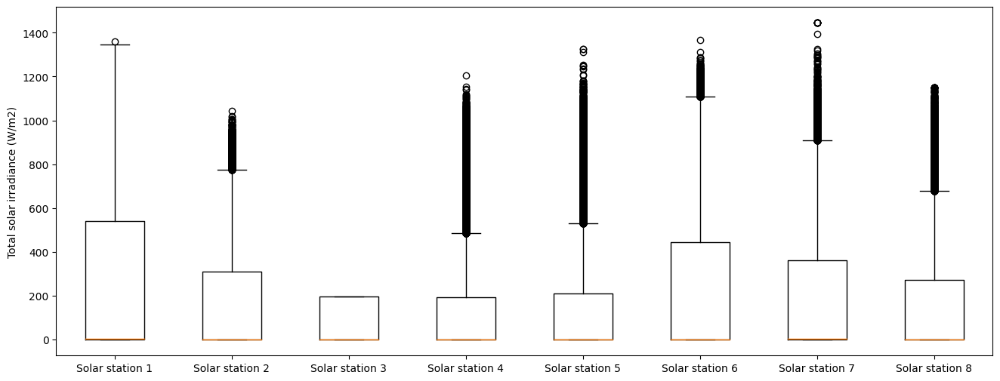

In [200]:
SS_name = ['Solar station 1', 'Solar station 2', 'Solar station 3', 'Solar station 4', 'Solar station 5', 'Solar station 6'
           , 'Solar station 7', 'Solar station 8']
plt.figure(figsize=(16,6))
plt.boxplot([Dataset_SS_site1.drop(Dataset_SS_site1[(Dataset_SS_site1['TSI'] == -99)|(Dataset_SS_site1['TSI'] == '<null>')].index).TSI
             ,Dataset_SS_site2.drop(Dataset_SS_site2[(Dataset_SS_site2['TSI'] == -99)|(Dataset_SS_site2['TSI'] == '<null>')].index).TSI
             ,Dataset_SS_site3.TSI[0:21000]
             ,Dataset_SS_site4.TSI
             ,Dataset_SS_site5.TSI
             ,Dataset_SS_site6.TSI.dropna()
             ,Dataset_SS_site7.drop(Dataset_SS_site7[(Dataset_SS_site7['TSI'] < 0)|(Dataset_SS_site7['TSI'] >3000)].index).TSI.dropna()
             ,Dataset_SS_site8.TSI], labels=SS_name);
plt.ylabel('Total solar irradiance (W/m2)')

The boxplot for total solar irradiance (TSI) across eight solar stations provides several insights:

1. **Variability in Irradiance**:
   - The range of TSI values varies significantly across stations. Some stations show a wide range, indicating high variability in solar irradiance, possibly due to local weather patterns or station operational hours.

2. **Median Irradiance Levels**:
   - The median TSI values, indicated by the horizontal line in the middle of each box, also vary between stations. Some stations have higher median values, suggesting that they generally receive more solar irradiance.

3. **Presence of Outliers**:
   - Most stations have outliers, which are depicted as individual points above the upper whisker of the boxplots. These could represent days with exceptionally high irradiance due to clear sky conditions or potential data recording errors.

4. **Consistency Across Stations**:
   - The interquartile ranges (the boxes themselves) show that while all stations have variability in irradiance, some stations (like Solar Stations 1 and 4) exhibit larger variability, as indicated by taller boxes.

5. **Irradiance Distribution**:
   - The whiskers, which represent the range of data excluding outliers, span a substantial range for most stations, indicating variability in irradiance likely due to changing weather conditions throughout the period of measurement.

In summary, the boxplot shows that while solar irradiance is generally expected to vary, there are marked differences in the range and median values of irradiance received at different solar stations. The outliers indicate that on some days, the irradiance can be significantly higher than typical values, which could be critical for energy forecasting and solar panel efficiency analysis. Cleaning the data of placeholders and unreasonable values is crucial for maintaining the integrity of the analysis.

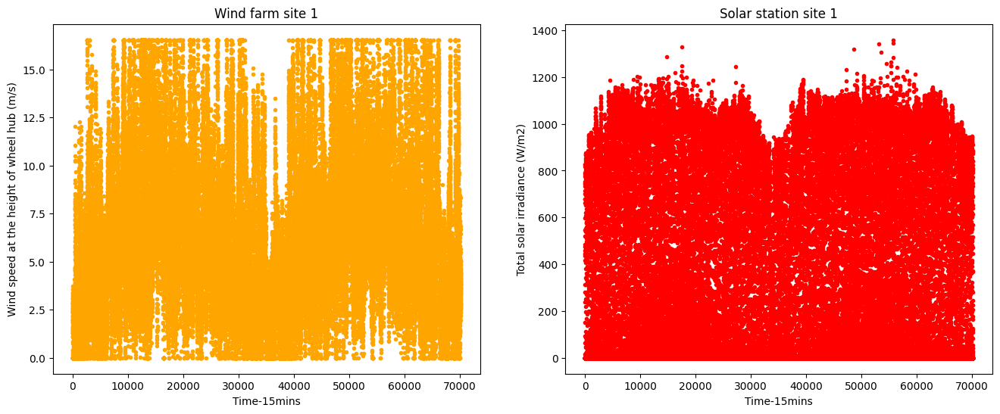

In [285]:
import matplotlib.pyplot as plt

plt.figure(figsize=(16,6))

# Plot for Wind farm site 1 with orange color
plt.subplot(1,2,1)
plt.plot(Dataset_WF_site1.drop(Dataset_WF_site1[Dataset_WF_site1['WS_cen']==-99].index).WS_cen, '.', c='orange')  # Changed color to orange
plt.xlabel('Time-15mins')
plt.ylabel('Wind speed at the height of wheel hub (m/s)')
plt.title('Wind farm site 1')

# Plot for Solar station site 1 with red color
plt.subplot(1,2,2)
plt.plot(Dataset_SS_site1.drop(Dataset_SS_site1[Dataset_SS_site1['TSI']==-99].index).TSI, '.', c='red')  # Changed color to orange
plt.xlabel('Time-15mins')
plt.ylabel('Total solar irradiance (W/m2)')
plt.title('Solar station site 1')

# Save the figure
plt.savefig('../image/outlier.pdf', bbox_inches='tight')


The provided plots display wind speed and total solar irradiance (TSI) data over time for a wind farm site and a solar station respectively. Here are observations from the visualizations:

**Wind Farm Site 1 (Left Plot)**
- There's a clear cyclic pattern in wind speed data, suggesting strong diurnal or seasonal variations, which could reflect natural wind speed fluctuations over time.
- There are periods of time with sharp drops to zero or near-zero wind speeds, which could represent calm conditions or periods of equipment downtime or maintenance.
- The density of data points is consistent, with few gaps, indicating reliable data collection for the wind speed at the wheel hub height.
- No outliers at value -99 are present, which means data cleaning has removed any erroneous recordings.

**Solar Station Site 1 (Right Plot)**
- The solar irradiance data shows a dense clustering at the top of the plot, with a clear upper limit that corresponds to the maximum possible solar irradiance, indicating times of peak sunlight.
- There is a bimodal distribution of values, with a concentration at the upper and lower bounds. This could correspond to daylight and nighttime (or overcast conditions), respectively.
- The points spread out in the middle range could be indicating varying weather conditions, like partial cloud cover, that affect irradiance.
- There is a clear drop to zero or near-zero irradiance regularly, likely corresponding to night times or extremely overcast weather when no solar irradiance is recorded.
- Just like the wind data, any TSI outliers at -99 have been removed, indicating successful data cleaning.

**General Observations:**
- The data for both the wind farm and solar station appear to have been recorded at regular intervals (every 15 minutes, as suggested by the xlabel), which is typical for monitoring renewable energy sites.
- The consistency of the data collection intervals is good for time-series analysis and forecasting.
- The scatter plots are a good choice for visualizing such dense data, as line plots could become cluttered and less interpretable.

The overall observation is that the wind and solar data follow expected daily patterns, but they are also subject to sporadic fluctuations that need to be accounted for in any operational and predictive analysis. These could be due to environmental changes, system performance issues, or both. Understanding these patterns is essential for optimizing energy production and grid integration of renewable energy sources.

## Exploratory Data Analysis for Renewable Energy in China

**Objective:**

The primary objective of this notebook is to analyze the variability, trends, and potential anomalies in solar and wind power generation data over multiple years. By dissecting daily power generation data, we aim to uncover underlying patterns that could inform future strategies for energy management and policy-making in China.

**Data Overview:**

The dataset utilized in this analysis comprises daily power generation records from various energy sources in China, filtered to focus specifically on solar and wind energy. Each record in the dataset includes the date, country, type of energy, and the amount of power generated in megawatts (MW). Special attention is given to data cleanliness and the correct transformation of date formats for a precise time series analysis.

**Analysis Steps:**

1. **Data Loading and Cleaning**: Import the dataset and perform initial data cleaning tasks, including filtering the data for China and focusing on solar and wind energy types.
   
2. **Data Transformation**: Convert date information into a datetime format to facilitate time series analysis and set it as the index for easier manipulation and plotting.

3. **Visualization**: Create time series plots to visually inspect solar and wind power generation trends, seasonal patterns, and any discernible anomalies. 

4. **Insights Extraction**: Analyze the plots to identify and discuss key observations such as seasonal trends, the dominance of wind power, variability in solar power generation, data discontinuities, and overall trends in renewable energy production.


In [286]:
import pandas as pd
Energy_Daily = pd.read_csv('../renewable_energy_data/eda_data/CarbonMonitor_Power_Data.csv')

In [287]:
Energy_Daily.head()

,date,country,type,value,label
0,01/04/2018,South Africa,Coal,473.635,N
1,01/04/2018,South Africa,Gas,0.000,N
2,01/04/2018,South Africa,Oil,0.000,N
3,01/04/2018,South Africa,Nuclear,22.328,N
4,01/04/2018,South Africa,Hydroelectricity,17.262,N


In [288]:
# Subset the data for China and focus only on Solar and Wind energy types
China_daily = Energy_Daily[(Energy_Daily['country'] == 'China') & (Energy_Daily['type'].isin(['Solar', 'Wind']))]
# Convert the 'date' column to datetime format
China_daily['date'] = pd.to_datetime(China_daily['date'], format='%d/%m/%Y')

/var/folders/yw/_jb44sv96y7_3954sb_smmcc0000gn/T/ipykernel_12854/3443771917.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  China_daily['date'] = pd.to_datetime(China_daily['date'], format='%d/%m/%Y')


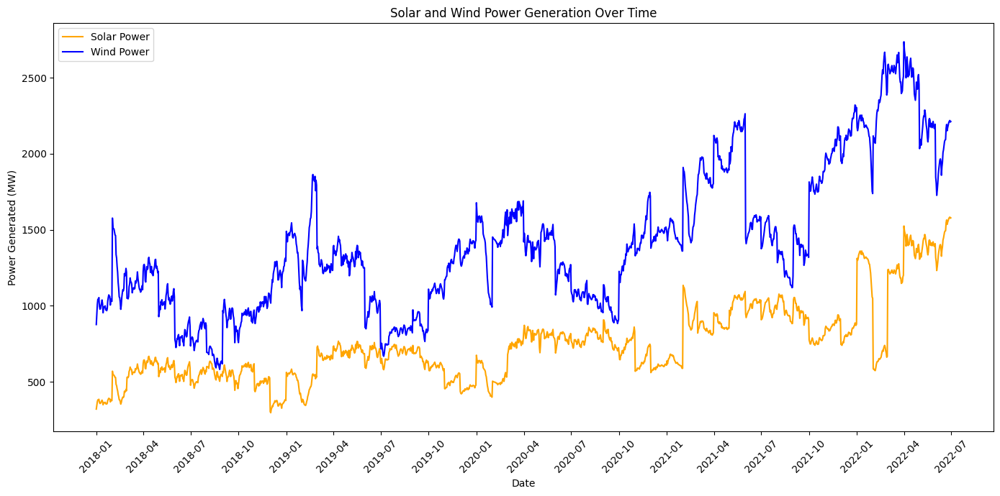

In [289]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
# Split the data into Solar and Wind
solar_data = China_daily[China_daily['type'] == 'Solar']
wind_data = China_daily[China_daily['type'] == 'Wind']

# Set the date as the index
solar_data.set_index('date', inplace=True)
wind_data.set_index('date', inplace=True)

# Plotting
plt.figure(figsize=(14, 7))

# Combined plot for Solar and Wind
plt.plot(solar_data['value'], label='Solar Power', color='orange')
plt.plot(wind_data['value'], label='Wind Power', color='blue')
plt.title('Solar and Wind Power Generation Over Time')
plt.xlabel('Date')
plt.ylabel('Power Generated (MW)')
plt.legend()

# Adjust x-axis to show the start of each season
ax = plt.gca()
ax.xaxis.set_major_locator(mdates.MonthLocator(bymonth=(1, 4, 7, 10)))  # Only the months starting each season
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format to show year and month

# Rotate date labels for better visibility
plt.xticks(rotation=45)

plt.tight_layout()
plt.savefig('../image/Solar_Wind_Over_Time.pdf', bbox_inches='tight')
plt.show()


The plot showcases solar and wind power generation in China over a multi-year period. Here are the observations:

1. Seasonal Trends: Both solar and wind power display some level of seasonality, with variations in power generation throughout the year. The peaks and troughs in the plot may correspond to seasonal changes affecting solar irradiance and wind patterns.

2. Wind Power Dominance: Wind power consistently surpasses solar power in terms of the quantity of megawatts generated. This could be due to larger installed capacities for wind, geographical advantages, or more consistent wind conditions.

3. Solar Power Variability: Solar power shows more pronounced short-term variability compared to wind power. This is expected as solar generation is directly affected by daylight hours and weather conditions on any given day.

4. Discontinuities: There are noticeable gaps or drops, especially in the solar power generation data. These could indicate days with little to no solar power generation, possibly due to weather conditions or data collection issues.

5. Data Anomalies: There are several sharp spikes and drops in solar generation data, which seem unnatural and could point to errors in data reporting or anomalies due to external factors not accounted for in the data.

6. Rising Trend: Both wind and solar power generation display a general upward trend over the years, reflecting China's increasing investment in renewable energy infrastructure.